# Applied Data Science Capstone

# Analyzing and Clustering all Boroughs in New York City for different nationalities

## Introduction

In this project, all the boroughs in New York City will be analyzed regarding the most common restaurants. The question is where to open up a restaurant to get as much customers as possible. The main analysis will be on Hispanic (Spanish, Mexican, Latin American) and Asian restaurants.
For this, the boroughs Manhattan, Bronx, Queens, Staten Island and Brooklyn will be analyzed and clustered.
The Foursquare API will be used to get nearby venues for all boroughs. Foursquare is a technology company that built a massive dataset of location data with access to it with an API.

Also a dataset from Kaggle will be used to get the New York City Census Data. This Data shows the cultural diversity of the New York City boroughs. With this data conclusions can be drawn how similar boroughs are and where future restaurant could be successfully be opened.

With k-means clustering the different distribution in the boroughs will be visualized, to show the differences in New York City.


### Data

Factors that influence the descision are:
* distribution of different restaurants in all boroughs of NYC
* demographic distribution in the boroughs of NYC


The following data will be used:
* A geojson file to get the location data of NYC
* Number, type and location of all restaurants will be obtained using **Foursquare API**
* Census Data of NYC from **Kaggle**


## Table of Contents

<div class="alert alert-block alert-info" style="margin-top: 20px">

<font size = 3>

1. <a href="#item1">Explore New York City Boroughs with Geojson file</a>

2. <a href="#item2">Explore Neighborhoods in New York City</a>

3. <a href="#item3">Analyze Each Neighborhood</a>

4. <a href="#item4">Cluster Neighborhoods</a>

5. <a href="#item5">Examine Clusters</a>    
</font>
</div>

In [68]:
import numpy as np

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json

from geopy.geocoders import Nominatim

import requests
from pandas.io.json import json_normalize

import matplotlib.cm as cm
import matplotlib.colors as colors

import matplotlib.pyplot as plt

from sklearn.cluster import KMeans

import folium
import os

import seaborn as sns

import json
print('Libraries imported.')

Libraries imported.


<a id='item1'></a>

# 1. Explore New York City Boroughs with  a Geojson file

#### Load and explore the geojson file

In [69]:
with open('nyu_2451_34572-geojson.json') as json_data:
    newyork_data = json.load(json_data)

Get the relevant data in features

In [70]:
neighborhoods_data = newyork_data['features']

#### Tranform the data into a *pandas* dataframe

In [71]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

Fill the dataframe one row at a time.

In [72]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [73]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


How many boroughs are in New York City with different Neighborhoods

In [74]:
neighborhoods.groupby(["Borough"]).count()

,Neighborhood,Latitude,Longitude
Borough,,,
Bronx,52,52,52
Brooklyn,70,70,70
Manhattan,40,40,40
Queens,81,81,81
Staten Island,63,63,63


In [75]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


## Geopy library to get the latitude and longitude valued of New York City.

In [76]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


### Get geographical coordinates for all New York City boroughs

In [77]:
address = 'Manhattan, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude_man = location.latitude
longitude_man = location.longitude
print('The geograpical coordinate of Manhattan are {}, {}.'.format(latitude_man, longitude_man))

address = 'Bronx, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude_bronx = location.latitude
longitude_bronx = location.longitude
print('The geograpical coordinate of Bronx are {}, {}.'.format(latitude, longitude))

address = 'Queens, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude_queens = location.latitude
longitude_queens = location.longitude
print('The geograpical coordinate of Queens are {}, {}.'.format(latitude, longitude))

address = 'Staten Island, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude_staten = location.latitude
longitude_staten = location.longitude
print('The geograpical coordinate of Staten Island are {}, {}.'.format(latitude, longitude))

address = 'Brooklyn, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude_brook = location.latitude
longitude_brook = location.longitude
print('The geograpical coordinate of Brooklyn are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Manhattan are 40.7896239, -73.9598939.
The geograpical coordinate of Bronx are 40.7127281, -74.0060152.
The geograpical coordinate of Queens are 40.7127281, -74.0060152.
The geograpical coordinate of Staten Island are 40.7127281, -74.0060152.
The geograpical coordinate of Brooklyn are 40.7127281, -74.0060152.


### Create a dataframe for every borough to analyze them separately

In [78]:
bronx_data =neighborhoods[neighborhoods["Borough"] == "Bronx"].reset_index(drop=True)
manhattan_data =neighborhoods[neighborhoods["Borough"] == "Manhattan"].reset_index(drop=True)
staten_data =neighborhoods[neighborhoods["Borough"] == "Staten Island"].reset_index(drop=True)
queens_data =neighborhoods[neighborhoods["Borough"] == "Queens"].reset_index(drop=True)
brooklyn_data =neighborhoods[neighborhoods["Borough"] == "Brooklyn"].reset_index(drop=True)

## Visualize New York City and all boroughs

### Show a map with different colours for the boroughs to visualize the borders 

In [79]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(bronx_data['Latitude'], bronx_data['Longitude'], bronx_data['Borough'], bronx_data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
for lat, lng, borough, neighborhood in zip(manhattan_data['Latitude'], manhattan_data['Longitude'], manhattan_data['Borough'], manhattan_data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='green',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork) 
    
for lat, lng, borough, neighborhood in zip(staten_data['Latitude'], staten_data['Longitude'], staten_data['Borough'], staten_data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)
for lat, lng, borough, neighborhood in zip(queens_data['Latitude'], queens_data['Longitude'], queens_data['Borough'], queens_data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
for lat, lng, borough, neighborhood in zip(brooklyn_data['Latitude'], brooklyn_data['Longitude'], brooklyn_data['Borough'], brooklyn_data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork) 
    
map_newyork

<a id='item2'></a>

# 2. Explore Neighborhoods of all Boroughs

### Using the Foursquare Api to get venues

Define Foursquare Credentials and Version

1. First get venues that are highly recommended with the API Endpoint ***explore*** in the method **getNearbyVenues**
3. Get all venues for Manhattan, Bronx, Queens, Brooklyn, Staten Island
4. Sort all venues for the ***explore*** endpoints by restaurant counts and visualize with barchart 

In [81]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT=100):
    
    venues_list=[]
    print("Start getting venues for borough")
    for name, lat, lng in zip(names, latitudes, longitudes):
        
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&sortByPopularity={}&time={}&day={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            1, "any", "any")
            
        # make the GET request
        results = requests.get(url).json()

        results = results["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    print("Next borough")
    return(nearby_venues)

#### Get all venues for Manhattan, Bronx, Queens, Staten Island, Brooklyn

The function **load_venues_explore** is used to check if a pickle file with the dataframe for one of the boroughs exists. If so the dataframe is loaded, if not the function **getNearbyVenues** is executed to get all venues from Foursquare for a specific latitude, longitude. 

In [82]:
import os
import pickle
import json

def load_venues_explore(file, data):
    if os.path.isfile(file):
        print("Pickle file is existent")
        with open(file, 'rb') as p:
            print("Load Dataframe with venues for {}".format(file))
            venues = pickle.load(p)
    else:
        venues = getNearbyVenues(names = data['Neighborhood'],
                               latitudes=data['Latitude'],
                               longitudes=data['Longitude'])
        
        venues.to_pickle('./' + file)
        

        
    return venues


In [42]:
manhattan_venues_explore = load_venues_explore('manhattan_explore.pkl', manhattan_data)
bronx_venues_explore = load_venues_explore('bronx_explore.pkl', bronx_data)
queens_venues_explore = load_venues_explore('queens_explore.pkl', queens_data)
staten_venues_explore = load_venues_explore('staten_explore.pkl', staten_data)
brooklyn_venues_explore = load_venues_explore('brooklyn_explore.pkl', brooklyn_data)

Start getting venues for borough
Next borough
Start getting venues for borough
Next borough
Start getting venues for borough
Next borough


In [456]:
manhattan_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marble Hill,40.876551,-73.91066,Golden City Chinese Restaurant,40.879319,-73.906187,Chinese Restaurant
1,Marble Hill,40.876551,-73.91066,blue bay restaurant,40.879181,-73.910093,Diner
2,Marble Hill,40.876551,-73.91066,China Wang Restaurant,40.877432,-73.906981,Food
3,Marble Hill,40.876551,-73.91066,El Economico Restaurant,40.879330,-73.904597,Spanish Restaurant
4,Marble Hill,40.876551,-73.91066,Medio Restaurant Coffee Shop,40.880832,-73.908419,Food


In [119]:
manhattan_venues_explore.shape

(2965, 7)

## Get the top 5 for restaurants in all 5 boroughs

In the next step the 5 boroughs will be analyzied to find out which restaurant style is most common. With this analysis one can see which cuisine style is common and which kind is less common. 


The Foursquare data for all 5 boroughs with its venues is already there. Now we want to filter this venues after categories to get only restaurant venues. 
After we get the restaurant filtered dataframe, the different restaurant types will be counted. This has to be done to get an impression which restaurant type is more common and recommended. 
At the end a plot will shown the top 5 restaurants for every borough. This will lead to a first impression of restaurant differences in the boroughs

In [164]:
def top_5_rest(borough_explore, name):
    
    #Get only venues which are restaurants
    category_restaurant_explore = borough_explore[(borough_explore["Venue Category"].str.contains("Restaurant"))]
    
    #Count the difference Venue Categories
    categories_explore = category_restaurant_explore.groupby("Venue Category").count()

    
    #Define new Dataframe
    venues_explore = categories_explore["Neighborhood"]
    venues_df_explore = pd.DataFrame(venues_explore)

    
    #Rename Dataframe to Count
    venues_df_explore.rename({"Neighborhood": "Count"}, inplace=True, axis=1)
    
    #Sort the Count values so the dataframe starts with the highest numbers
    venues_df_explore.sort_values("Count", ascending=False, inplace=True)

    #Plot barchart for dataframe with recommended restaurants from explore endpoint
    restaurant_top_5_e = venues_df_explore.head(5)
    print(restaurant_top_5_e)
    restaurant_top_5_e.plot(kind="bar", figsize=(10, 5), title="Top 5 restaurants in {}".format(name))
    #plt.savefig(name+".png")

#### Top 5 restaurants in Manhattan

                     Count
Venue Category            
Italian Restaurant     117
American Restaurant     58
Chinese Restaurant      47
Mexican Restaurant      43
Japanese Restaurant     41


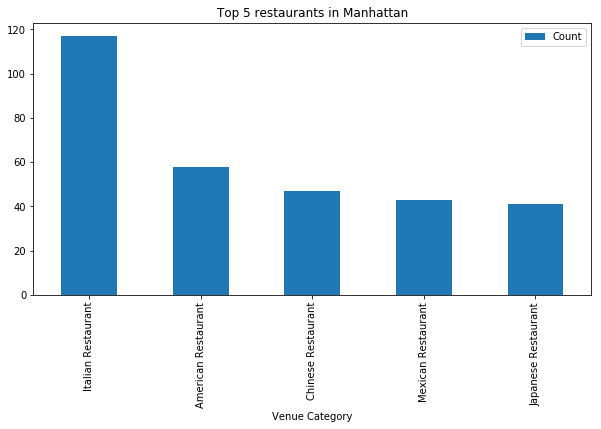

In [165]:
top_5_rest(manhattan_venues_explore, "Manhattan")

Manhattan has got a high number of **Italian restaurants with 117**. Also Asian style restaurants (Chinese and Japanese) are often recommended, in total **88 restaurants**.

#### Top 5 restaurants in Bronx

                      Count
Venue Category             
Chinese Restaurant       44
Italian Restaurant       38
Spanish Restaurant       30
Mexican Restaurant       27
Fast Food Restaurant     27


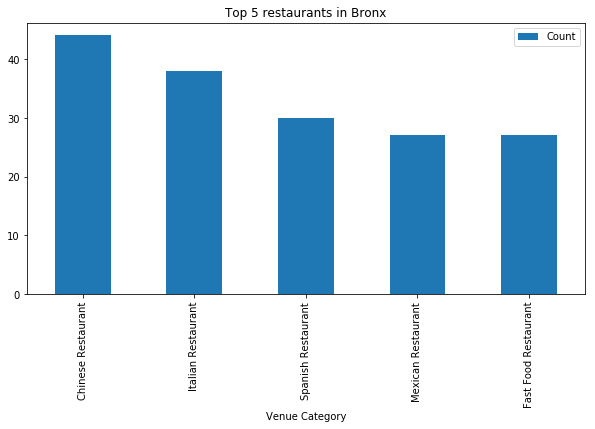

In [123]:
top_5_rest(bronx_venues_explore, "Bronx")


In the Bronx there are a lot Hispanic style restaurants. In total there are **57 Hispanic restaurants**. 

##### Top 5 restaurants in Queens

                           Count
Venue Category                  
Chinese Restaurant            55
Korean Restaurant             41
Italian Restaurant            37
Mexican Restaurant            36
Latin American Restaurant     29


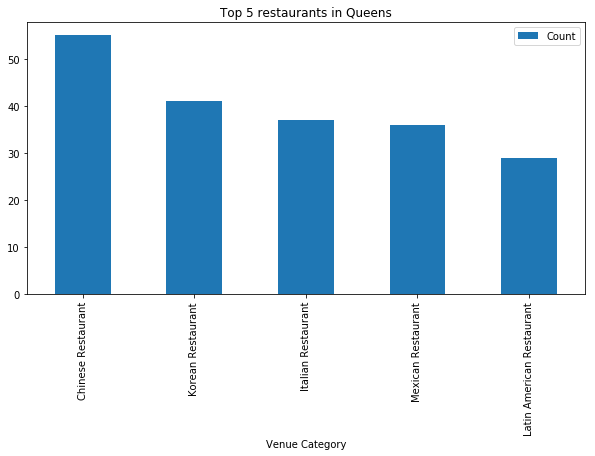

In [124]:
top_5_rest(queens_venues_explore, "Queens")

In Queens Asian restaurants are more often recommended. In total, Chinese and Korean restaurants, there are **96 Asian restaurants**. 

#### Top 5 restaurants in Brooklyn

                      Count
Venue Category             
Italian Restaurant       62
Chinese Restaurant       50
American Restaurant      46
Mexican Restaurant       46
Caribbean Restaurant     35


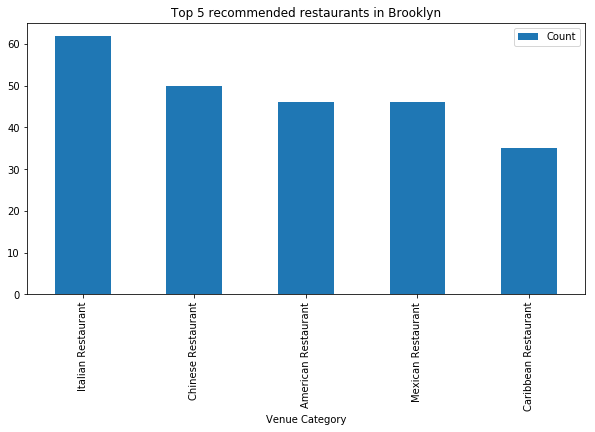

In [66]:
top_5_rest(brooklyn_venues_explore, "Brooklyn")

Brooklyn has got the highest number of Italian restaurants after Manhattan. Also there are **46 Hispanic style restaurants** and **50 Asian style restaurants**.

#### Top 5 restaurants in Staten Island

                     Count
Venue Category            
Italian Restaurant      42
American Restaurant     16
Mexican Restaurant      15
Chinese Restaurant      14
Sushi Restaurant        12


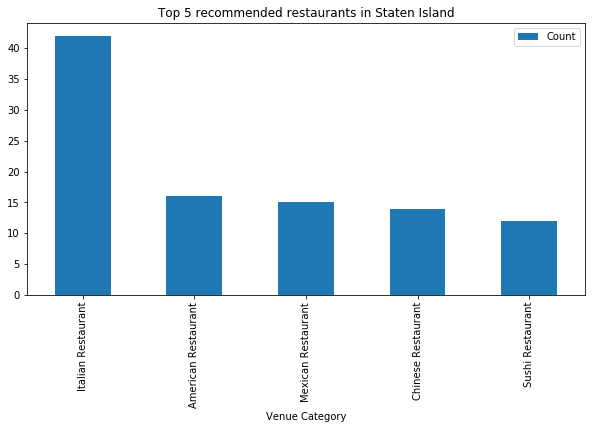

In [67]:
top_5_rest(staten_venues_explore, "Staten Island")

Staten Island is the borough with less Chinese restaurants and less Spanish/Mexican restaurants. 

With further analysis of the demographic distribution in New York City the restaurant distribution should be get clearer.

# 3. Analyze Each Neighborhood

## 3.1 Use Kaggle Census Data to analyze the demographic distribution in the Boroughs

A statistical analysis is done to show which cultural differences are present in NYC. This analysis makes it possible to see the demographic distribution of Asian and Hispanics.  
For this analysis the main focus will be on Asian and Hispanic citizen to see the impact on the associated restaurants.

In [126]:
#Census Data 
df = pd.read_csv("nyc_census_tracts.csv")
df.head()

,CensusTract,County,Borough,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Citizen,Income,IncomeErr,IncomePerCap,IncomePerCapErr,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,36005000100,Bronx,Bronx,7703,7133,570,29.9,6.1,60.9,0.2,1.6,6476,NaN,NaN,2440.0,373.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN
1,36005000200,Bronx,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,72034.0,13991.0,22180.0,2206.0,20.0,20.7,28.7,17.1,23.9,8.0,22.3,44.8,13.7,38.6,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7
2,36005000400,Bronx,Bronx,5915,2896,3019,62.7,3.6,30.7,0.0,0.3,4100,74836.0,8407.0,27700.0,2449.0,13.2,23.6,32.2,23.4,24.9,9.0,10.5,41.3,10.0,44.6,1.4,0.5,2.1,45.0,2675,71.7,25.3,2.5,0.6,9.5
3,36005001600,Bronx,Bronx,5879,2558,3321,65.1,1.6,32.4,0.0,0.0,3536,32312.0,6859.0,17526.0,2945.0,26.3,35.9,19.1,36.1,26.2,4.9,13.8,37.2,5.3,45.5,8.6,1.6,1.7,38.8,2120,75.0,21.3,3.8,0.0,8.7
4,36005001900,Bronx,Bronx,2591,1206,1385,55.4,9.0,29.0,0.0,2.1,1557,37936.0,3771.0,17986.0,2692.0,37.1,31.5,35.4,20.9,26.2,6.6,11.0,19.2,5.3,63.9,3.0,2.4,6.2,45.4,1083,76.8,15.5,7.7,0.0,19.2


In [127]:
#Census data with latitude, longitude
census = pd.read_csv("census_block_loc.csv")
census.head()

,Latitude,Longitude,BlockCode,County,State
0,40.48,-74.280000,340230076002012,Middlesex,NJ
1,40.48,-74.276834,340230076005000,Middlesex,NJ
2,40.48,-74.273668,340230076003018,Middlesex,NJ
3,40.48,-74.270503,340230076003004,Middlesex,NJ
4,40.48,-74.267337,340230074021000,Middlesex,NJ


Merge both dataframes, to get one singe dataframe with Census data and latitude, longitude. 
The Census data shows the percentage of for example Hispanics living in a specific latitude, longitude. So it is important to know that there are multiple percentages for the boroughs, as the Census data is specified for the latitude, longitude in NYC.

In [131]:
try:
    census["CensusTract"]= census["BlockCode"]//10000
    census.drop("BlockCode", axis=1, inplace=True)
except:
    print("BlockCode already removed")

census_data = df.merge(census, how="left", left_on="CensusTract", right_on="CensusTract")
census_data = census_data.dropna()
census_data.reset_index(inplace=True, drop=True)
census_data.head()

BlockCode already removed


,CensusTract,County_x,Borough,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Citizen,Income,IncomeErr,IncomePerCap,IncomePerCapErr,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Latitude,Longitude,County_y,State
0,36005000200,Bronx,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,72034.0,13991.0,22180.0,2206.0,20.0,20.7,28.7,17.1,23.9,8.0,22.3,44.8,13.7,38.6,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7,40.798844,-73.862111,Bronx,NY
1,36005000200,Bronx,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,72034.0,13991.0,22180.0,2206.0,20.0,20.7,28.7,17.1,23.9,8.0,22.3,44.8,13.7,38.6,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7,40.798844,-73.858945,Bronx,NY
2,36005000200,Bronx,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,72034.0,13991.0,22180.0,2206.0,20.0,20.7,28.7,17.1,23.9,8.0,22.3,44.8,13.7,38.6,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7,40.801106,-73.862111,Bronx,NY
3,36005000200,Bronx,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,72034.0,13991.0,22180.0,2206.0,20.0,20.7,28.7,17.1,23.9,8.0,22.3,44.8,13.7,38.6,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7,40.801106,-73.858945,Bronx,NY
4,36005000200,Bronx,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,72034.0,13991.0,22180.0,2206.0,20.0,20.7,28.7,17.1,23.9,8.0,22.3,44.8,13.7,38.6,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7,40.801106,-73.855779,Bronx,NY


Get the mean of all Hispanics in all 5 boroughs. On Average most Hispanics live in the Bronx, than in Manhattan.

In [87]:
census_data.groupby(["Borough"])["Hispanic"].mean()

Borough
Bronx            44.126034
Brooklyn         18.228561
Manhattan        24.543898
Queens           20.862614
Staten Island    15.987936
Name: Hispanic, dtype: float64

Get the max percentage of Hispanics living in the boroughs. There are as expected the highest percentage of Hispanics in the Bronx, after that in Queens and Manhattan.

In [88]:
census_data.groupby(["Borough"])["Hispanic"].max()

Borough
Bronx            91.2
Brooklyn         86.9
Manhattan        92.0
Queens           95.6
Staten Island    63.4
Name: Hispanic, dtype: float64

Get the mean percentage of Asian in the boroughs. On average the most Asians live in Queens.

In [110]:
census_data.groupby(["Borough"])["Asian"].mean()

Borough
Bronx             3.916773
Brooklyn          9.865794
Manhattan        12.917029
Queens           21.171634
Staten Island     6.966693
Name: Asian, dtype: float64

Get the maximum percentage of Asian in the boroughs. The maximum percentage of Asian live in Queens, Brooklyn and Manhattan.

In [90]:
census_data.groupby(["Borough"])["Asian"].max()

Borough
Bronx            36.7
Brooklyn         86.8
Manhattan        83.9
Queens           89.8
Staten Island    29.2
Name: Asian, dtype: float64

### Summary of demographic distribution for Asian and Hispanics with Choropleth map

Aggregate Hispanics in all boroughs and add the data to a choropleth map. Another geojson file will be used, which only focuses on the borough limits.

In [96]:
with open('new-york-city-boroughs.geojson') as json_data:
    borough_data = json.load(json_data)

In [93]:
his = census_data.groupby(["Borough"])["Hispanic"].mean().to_frame()
his.reset_index(inplace=True)
his = his.round(1) 
his

,Borough,Hispanic
0,Bronx,44.1
1,Brooklyn,18.2
2,Manhattan,24.5
3,Queens,20.9
4,Staten Island,16.0


In [99]:
hispanics= folium.Map(location=[latitude, longitude], zoom_start=10)
folium.GeoJson(borough_data).add_to(hispanics)

In [100]:
hispanics.choropleth(geo_data=borough_data,
                      data=his,
                      columns=['Borough', 'Hispanic'],
                      key_on='feature.properties.name',
                      fill_color="YlOrRd",
                      fill_opacity="0.7",
                      line_opacity="0.5",
                      legend_name="Average distribution of Hispanics in New York City boroughs")

folium.LayerControl().add_to(hispanics)
hispanics

In [111]:
asian = census_data.groupby(["Borough"])["Asian"].mean().to_frame()
asian.reset_index(inplace=True)
asian = asian.round(1) 
asian

,Borough,Asian
0,Bronx,3.9
1,Brooklyn,9.9
2,Manhattan,12.9
3,Queens,21.2
4,Staten Island,7.0


In [167]:
asia = folium.Map(location=[latitude, longitude], zoom_start=9)
folium.GeoJson(borough_data).add_to(asia)

In [172]:
asia.choropleth(geo_data=borough_data,
                      data=asian,
                      columns=['Borough', 'Asian'],
                      key_on='feature.properties.name',
                      fill_color="YlOrRd",
                      fill_opacity="0.7",
                      line_opacity="0.5",
                      legend_name="Average distribution of Asian in New York City boroughs")

folium.LayerControl().add_to(asia)
asia


In [173]:
asia.save('asia.png')

## 3.2 One hot encode all restaurant venues in the boroughs and sort the most common ones

In [179]:
def encode(borough):
    # one hot encoding
    restaurant_borough = borough[borough['Venue Category'].str.contains("Restaurant")]
    borough_onehot = pd.get_dummies(restaurant_borough['Venue Category'], prefix="", prefix_sep="")

    # add neighborhood column back to dataframe    
    try:
        borough_onehot.insert(0,"Neighborhood",borough["Neighborhood"])

    except:
        borough_onehot.drop("Neighborhood", inplace=True, axis=1)
        borough_onehot.insert(0,"Neighborhood",borough["Neighborhood"])

    return borough_onehot.reset_index(drop=True)

In [181]:
manhattan_onehot = encode(manhattan_venues_explore)
manhattan_onehot.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Belgian Restaurant,Cambodian Restaurant,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Chinese Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Empanada Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Greek Restaurant,Hawaiian Restaurant,Hotpot Restaurant,Indian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewish Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Lebanese Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Molecular Gastronomy Restaurant,Moroccan Restaurant,New American Restaurant,North Indian Restaurant,Persian Restaurant,Peruvian Restaurant,Ramen Restaurant,Restaurant,Russian Restaurant,Scandinavian Restaurant,Seafood Restaurant,Shanghai Restaurant,Soba Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sri Lankan Restaurant,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
0,Marble Hill,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Marble Hill,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Marble Hill,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Chinatown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Chinatown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [191]:
bronx_onehot = encode(bronx_venues_explore)

In [192]:
brooklyn_onehot = encode(brooklyn_venues_explore)

In [193]:
staten_onehot = encode(staten_venues_explore)

In [194]:
queens_onehot = encode(queens_venues_explore)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [182]:
manhattan_grouped = manhattan_onehot.groupby('Neighborhood').mean().reset_index()
manhattan_grouped.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Belgian Restaurant,Cambodian Restaurant,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Chinese Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Empanada Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Greek Restaurant,Hawaiian Restaurant,Hotpot Restaurant,Indian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewish Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Lebanese Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Molecular Gastronomy Restaurant,Moroccan Restaurant,New American Restaurant,North Indian Restaurant,Persian Restaurant,Peruvian Restaurant,Ramen Restaurant,Restaurant,Russian Restaurant,Scandinavian Restaurant,Seafood Restaurant,Shanghai Restaurant,Soba Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sri Lankan Restaurant,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
0,Battery Park City,0.0,0.000000,0.000000,0.0,0.00,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.500000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.00,0.0,0.0,0.000000,0.000000,0.500000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.00,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
1,Carnegie Hill,0.0,0.000000,0.050000,0.0,0.05,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.05,0.0,0.100000,0.0,0.000000,0.0,0.000000,0.050000,0.0,0.150000,0.0,0.150000,0.0,0.0,0.05,0.0,0.0,0.000000,0.000000,0.050000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.050000,0.050000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.05,0.0,0.0,0.000000,0.000000,0.050000,0.0,0.0,0.0,0.0,0.000000,0.100000
2,Central Harlem,0.0,0.142857,0.142857,0.0,0.00,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.071429,0.0,0.142857,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.071429,0.0,0.00,0.0,0.142857,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.00,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.142857,0.000000,0.0,0.0,0.071429,0.000000,0.0,0.00,0.0,0.0,0.000000,0.071429,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
3,Chelsea,0.0,0.000000,0.111111,0.0,0.00,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.055556,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.055556,0.0,0.166667,0.0,0.055556,0.0,0.0,0.00,0.0,0.0,0.000000,0.055556,0.000000,0.055556,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.055556,0.055556,0.0,0.0,0.166667,0.000000,0.0,0.0,0.000000,0.055556,0.0,0.00,0.0,0.0,0.000000,0.055556,0.055556,0.0,0.0,0.0,0.0,0.000000,0.000000
4,Chinatown,0.0,0.000000,0.023256,0.0,0.00,0.0,0.023256,0.023256,0.0,0.0,0.046512,0.000000,0.0,0.186047,0.0,0.0,0.069767,0.069767,0.0,0.023256,0.000000,0.0,0.00,0.0,0.000000,0.0,0.023256,0.0,0.023256,0.000000,0.0,0.023256,0.0,0.023256,0.0,0.0,0.00,0.0,0.0,0.093023,0.000000,0.023256,0.000000,0.0,0.0,0.0,0.023256,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.023256,0.046512,0.0,0.0,0.000000,0.023256,0.0,0.00,0.0,0.0,0.046512,0.000000,0.023256,0.0,0.0,0.0,0.0,0.069767,0.069767


In [195]:
bronx_grouped = bronx_onehot.groupby('Neighborhood').mean().reset_index()

In [196]:
queens_grouped = queens_onehot.groupby('Neighborhood').mean().reset_index()

In [197]:
staten_grouped = staten_onehot.groupby('Neighborhood').mean().reset_index()

In [198]:
brooklyn_grouped = brooklyn_onehot.groupby('Neighborhood').mean().reset_index()

#### Let's print each neighborhood along with the top 10 most common venues

First, let's write a function to sort the venues in descending order.

In [186]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [184]:
def top_10(borough_grouped):
    num_top_venues = 10

    indicators = ['st', 'nd', 'rd']

    # create columns according to number of top venues
    columns = ['Neighborhood']
    for ind in np.arange(num_top_venues):
        try:
            columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
        except:
            columns.append('{}th Most Common Venue'.format(ind+1))

    # create a new dataframe
    neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
    neighborhoods_venues_sorted['Neighborhood'] = borough_grouped['Neighborhood']

    for ind in np.arange(borough_grouped.shape[0]):
        neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(borough_grouped.iloc[ind, :], num_top_venues)

    neighborhoods_venues_sorted.head()
    return neighborhoods_venues_sorted

<a id='item4'></a>

In [187]:
manhattan_venues_sorted = top_10(manhattan_grouped)
manhattan_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Battery Park City,Chinese Restaurant,Mexican Restaurant,Vietnamese Restaurant,Greek Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant
1,Carnegie Hill,Italian Restaurant,Japanese Restaurant,Vietnamese Restaurant,French Restaurant,Restaurant,American Restaurant,Argentinian Restaurant,Fast Food Restaurant,Indian Restaurant,Mexican Restaurant
2,Central Harlem,African Restaurant,American Restaurant,Seafood Restaurant,Chinese Restaurant,French Restaurant,Ethiopian Restaurant,Caribbean Restaurant,Tapas Restaurant,Southern / Soul Food Restaurant,Falafel Restaurant
3,Chelsea,Italian Restaurant,Seafood Restaurant,American Restaurant,Mediterranean Restaurant,Japanese Restaurant,Indian Restaurant,Thai Restaurant,Tapas Restaurant,Ramen Restaurant,Restaurant
4,Chinatown,Chinese Restaurant,Malay Restaurant,Vietnamese Restaurant,Vegetarian / Vegan Restaurant,Dumpling Restaurant,Dim Sum Restaurant,Shanghai Restaurant,Taiwanese Restaurant,Cantonese Restaurant,Japanese Restaurant


In [199]:
bronx_venues_sorted = top_10(bronx_grouped)
bronx_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Chinese Restaurant,Spanish Restaurant,Mexican Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Indian Restaurant,American Restaurant,Arepa Restaurant,Asian Restaurant,Caribbean Restaurant
1,Baychester,Spanish Restaurant,Mexican Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Indian Restaurant,American Restaurant,Arepa Restaurant,Asian Restaurant,Caribbean Restaurant,Chinese Restaurant
2,Bedford Park,Chinese Restaurant,Mexican Restaurant,Spanish Restaurant,Vietnamese Restaurant,Indian Restaurant,American Restaurant,Arepa Restaurant,Asian Restaurant,Caribbean Restaurant,Comfort Food Restaurant
3,Belmont,Italian Restaurant,Restaurant,Mexican Restaurant,American Restaurant,Spanish Restaurant,Eastern European Restaurant,Japanese Restaurant,Fast Food Restaurant,Greek Restaurant,Arepa Restaurant
4,Bronxdale,Italian Restaurant,Spanish Restaurant,Chinese Restaurant,Eastern European Restaurant,Mexican Restaurant,Indian Restaurant,American Restaurant,Arepa Restaurant,Asian Restaurant,Caribbean Restaurant


In [200]:
queens_venues_sorted = top_10(queens_grouped)
queens_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arverne,Thai Restaurant,Vietnamese Restaurant,Dumpling Restaurant,Hotpot Restaurant,Himalayan Restaurant,Halal Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
1,Astoria,Middle Eastern Restaurant,Greek Restaurant,Mediterranean Restaurant,Seafood Restaurant,Japanese Restaurant,Indian Restaurant,Thai Restaurant,Mexican Restaurant,American Restaurant,Moroccan Restaurant
2,Astoria Heights,Italian Restaurant,Eastern European Restaurant,Hunan Restaurant,Hotpot Restaurant,Himalayan Restaurant,Halal Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
3,Auburndale,Sushi Restaurant,American Restaurant,Italian Restaurant,Korean Restaurant,Fast Food Restaurant,German Restaurant,Empanada Restaurant,Falafel Restaurant,Filipino Restaurant,French Restaurant
4,Bay Terrace,American Restaurant,Gluten-free Restaurant,Vietnamese Restaurant,Eastern European Restaurant,Hunan Restaurant,Hotpot Restaurant,Himalayan Restaurant,Halal Restaurant,Greek Restaurant,German Restaurant


In [201]:
staten_venues_sorted = top_10(staten_grouped)
staten_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Annadale,American Restaurant,Sushi Restaurant,Restaurant,Italian Restaurant,Asian Restaurant,Cajun / Creole Restaurant,Caribbean Restaurant,Chinese Restaurant,Comfort Food Restaurant,Dim Sum Restaurant
1,Arlington,American Restaurant,Japanese Restaurant,Asian Restaurant,Cajun / Creole Restaurant,Caribbean Restaurant,Chinese Restaurant,Comfort Food Restaurant,Dim Sum Restaurant,Eastern European Restaurant,Fast Food Restaurant
2,Arrochar,Italian Restaurant,Polish Restaurant,Mediterranean Restaurant,Middle Eastern Restaurant,Vietnamese Restaurant,German Restaurant,French Restaurant,Filipino Restaurant,Fast Food Restaurant,Eastern European Restaurant
3,Bay Terrace,Sushi Restaurant,Vietnamese Restaurant,Japanese Restaurant,Asian Restaurant,Cajun / Creole Restaurant,Caribbean Restaurant,Chinese Restaurant,Comfort Food Restaurant,Dim Sum Restaurant,Eastern European Restaurant
4,Bulls Head,Chinese Restaurant,American Restaurant,Sushi Restaurant,Japanese Restaurant,Italian Restaurant,Tex-Mex Restaurant,Thai Restaurant,Asian Restaurant,Cajun / Creole Restaurant,Caribbean Restaurant


In [202]:
brooklyn_venues_sorted = top_10(brooklyn_grouped)
brooklyn_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bath Beach,Chinese Restaurant,Italian Restaurant,Sushi Restaurant,Fast Food Restaurant,Cantonese Restaurant,Russian Restaurant,Turkish Restaurant,Pakistani Restaurant,Asian Restaurant,Peruvian Restaurant
1,Bay Ridge,Italian Restaurant,American Restaurant,Greek Restaurant,Chinese Restaurant,Thai Restaurant,Sushi Restaurant,New American Restaurant,Caucasian Restaurant,Dim Sum Restaurant,Fast Food Restaurant
2,Bedford Stuyvesant,Japanese Restaurant,New American Restaurant,Eastern European Restaurant,Indian Restaurant,Hotpot Restaurant,Hawaiian Restaurant,Halal Restaurant,Greek Restaurant,German Restaurant,French Restaurant
3,Bensonhurst,Italian Restaurant,Sushi Restaurant,Hotpot Restaurant,Russian Restaurant,Chinese Restaurant,Shabu-Shabu Restaurant,American Restaurant,Burmese Restaurant,Cajun / Creole Restaurant,Indian Restaurant
4,Boerum Hill,French Restaurant,Japanese Restaurant,Seafood Restaurant,Cajun / Creole Restaurant,Chinese Restaurant,Halal Restaurant,Indian Restaurant,Italian Restaurant,Mexican Restaurant,Middle Eastern Restaurant


# 4. Cluster Neighborhoods for all boroughs

Run *k*-means to cluster the neighborhood into 5 clusters. This will cluster similar restaurants into one cluster. With this furthermore analysis the different boroughs in NYC can be compared in terms of cluster distribution.

In [404]:
def cluster(borough_grouped, kcluster=5):


    grouped_clustering = borough_grouped.drop('Neighborhood', 1)
    # run k-means clustering
    kmeans = KMeans(n_clusters=kcluster, random_state=0).fit(grouped_clustering)

    # check cluster labels generated for each row in the dataframe
    kmeans.labels_[0:10] 
    return kmeans

In [405]:
kmeans_manhattan = cluster(manhattan_grouped)

In [406]:
kmeans_bronx = cluster(bronx_grouped)

In [407]:
kmeans_queens = cluster(queens_grouped)

In [408]:
kmeans_staten = cluster(staten_grouped)

In [409]:
kmeans_brooklyn = cluster(brooklyn_grouped)

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [410]:
def add_cluster_label(neighborhoods_venues_sorted, data, cluster):
    # add clustering labels
    #neighborhoods_venues_sorted.drop("Cluster Labels", axis=1, inplace=True)
    try:
        neighborhoods_venues_sorted.insert(0, 'Cluster Labels', cluster.labels_)
    except:
        neighborhoods_venues_sorted.drop("Cluster Labels", axis=1, inplace=True)
        neighborhoods_venues_sorted.insert(0, 'Cluster Labels', cluster.labels_)


    # merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
    borough_merged = data.merge(neighborhoods_venues_sorted, on='Neighborhood', how='right')

    return borough_merged

In [411]:
manhattan_merged = add_cluster_label(manhattan_venues_sorted, manhattan_data, kmeans_manhattan)

In [412]:
bronx_merged = add_cluster_label(bronx_venues_sorted, bronx_data, kmeans_bronx)

In [414]:
queens_merged = add_cluster_label(queens_venues_sorted, queens_data, kmeans_queens)

In [416]:
staten_merged = add_cluster_label(staten_venues_sorted, staten_data, kmeans_staten)

In [417]:
brooklyn_merged = add_cluster_label(brooklyn_venues_sorted, brooklyn_data, kmeans_brooklyn)

Finally, let's visualize the resulting clusters

In [418]:
kclusters = 5

In [419]:
# create map
map_clusters_manhattan = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(manhattan_merged['Latitude'], manhattan_merged['Longitude'], manhattan_merged['Neighborhood'], manhattan_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_manhattan)
       
map_clusters_manhattan

In [420]:
# create map
map_clusters_bronx = folium.Map(location=[latitude_bronx, longitude_bronx], zoom_start=11)
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(bronx_merged['Latitude'], bronx_merged['Longitude'], bronx_merged['Neighborhood'], bronx_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_bronx)
       
map_clusters_bronx

In [421]:
# create map
map_clusters = folium.Map(location=[latitude_queens, longitude_queens], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(queens_merged['Latitude'], queens_merged['Longitude'], queens_merged['Neighborhood'], queens_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [422]:
# create map
map_clusters = folium.Map(location=[latitude_staten, longitude_staten], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(staten_merged['Latitude'], staten_merged['Longitude'], staten_merged['Neighborhood'], staten_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [423]:
# create map
map_clusters = folium.Map(location=[latitude_brook, longitude_brook], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(brooklyn_merged['Latitude'], brooklyn_merged['Longitude'], brooklyn_merged['Neighborhood'], brooklyn_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

<a id='item5'></a>

# 5. Examine Clusters and Results

All boroughs have been examined to get a detailed view of existent state of restaurants in NYC. For this case three analysis have been made.
* Analysis of recommended restaurants and common restaurants in an area
* Statistical analysis of Asian and Hispanic distribution in NYC
* Cluster distribution of different restaurants in all boroughs.

## Results

* Most recommended restaurants are Italian restaurants.
* Most Hispanics live in the Bronx, Queens and Manhattan.
* Most Asian live in Queens, Brooklyn and Manhattan.
* In Queens are most common Chinese restaurants and second recommended after Italien restaurants.
* In Staten Island and Manhattan are Chinese Restaurants less often recommended.
* In the Bronx with the highest distribution of Hispanics, is the highest recommended varity of Hispanic restaurants: Spanish, Mexican and Latin American restaurants.
* In Staten Island is the smallest number of Hispanic restaurants, also correlating with real distribution of Hispanics in this area.

## Examining Clusters

Comparing the cluster plot:
    * The Bronx is not uniform and shows a lot of different clusters in one area
    * Just like the Bronx is Queens not uniform
    * Manhattan and Brooklyn have 2 bigger clusters
    * Staten Island has a less higher density.

## Discussion

As a recommondation to open up a restaurant, would be to open a Hispanic style restaurant in Manhattan, because:
* There are more Hispanics in Manhattan than in Brooklyn, but less restaurant. So it could be a good idea to start a spanish restaurant in Manhattan.

